<a href="https://colab.research.google.com/github/rouyu0405/Smart-Overwatch-CV-Project/blob/main/Smart%20Overwatch%20Senior%20Fall%20Detection%20Computer%20Vision%20Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Smart Overwatch - Senior Fall Detection Computer Vision Project**
This project is to identify if seniors are in a safe position. We have trained a computer vision model using YOLOv8 to perform object detection in indoor locations to detect if seniors have fallen. This is important in guaranteeing that seniors receive help as soon as possible; the faster fallen seniors receive help, the higher the possibility of recovery there is.

**Prepration**

Import YOLOv8

In [16]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.2/112.6 GB disk)


In [17]:
from ultralytics import YOLO

Import Libraries

In [18]:
import os, shutil, yaml
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

Connect to Google Drive

In [19]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **Data Preprocessing**

In [21]:
model = YOLO('yolov8n.pt') # pretrained model

In [22]:
model

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_s

In [24]:
%%writefile config.yaml
path: /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset
train: /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/train
test: /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test
val: /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/val

# Classes
nc: 3 #

# Class names
names:
  0: fallen
  1: sitting
  2: standing


Overwriting config.yaml


## **Training**

In [25]:
model.train(
    data="config.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    name="fall_yolov8n_baseline")

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=config.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=fall_yolov8n_baseline5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=1

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c50013a3980>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

## **Hyperparameter**

In [26]:
hyp_yaml = """
lr0: 0.005       # lower initial learning rate
lrf: 0.1       # slower decay, final learning rate
momentum: 0.94        #
weight_decay: 0.0005       # penalize weights --> reduce overfitting
warmup_epochs: 3.0       # increase learning rate
warmup_momentum: 0.8       # increse momentum

# reduce
hsv_h: 0.015       # changes hue
hsv_s: 0.7       # changes saturation
hsv_v: 0.4       # changes brightness
"""

with open("tuned_hyp.yaml", "w") as f:
    f.write(hyp_yaml)

print("Custom hyperparameters saved to tuned_hyp.yaml")

with open("tuned_hyp.yaml") as f:
    hyp_dict = yaml.safe_load(f)

model = YOLO("yolov8n.pt")
model.train(
    data="config.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    name="fall_yolov8n_tuned",
    **hyp_dict
  )

Custom hyperparameters saved to tuned_hyp.yaml
Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=config.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.005, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.94, mosaic=1.0, multi_scale=False, name=fall_yolov8n_tuned, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patienc

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c4fd840a960>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

## **Evaluate**

In [28]:
!yolo val task=detect model="runs/detect/fall_yolov8n_baseline5/weights/best.pt" data="config.yaml"
!yolo val task=detect model="runs/detect/fall_yolov8n_tuned/weights/best.pt" data="config.yaml"

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.9±0.3 ms, read: 25.9±19.1 MB/s, size: 50.5 KB)
val: Scanning /content/drive/.shortcut-targets-by-id/1bRDoglAXKiYpWkFISBu30kGheB2g6-uX/360_Project/Datasets/csv_final_dataset/labels/val.cache... 211 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 211/211 3.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 3.5it/s 4.0s
                   all        211        219      0.728      0.615       0.68      0.451
                fallen        150        150      0.795      0.913      0.923      0.628
               sitting         65         67      0.766      0.433      0.622      0.329
              standing          2          2      0.623        0.5      0.496      0.397
Speed: 2.9ms preprocess, 6.8ms inference, 0.0ms l

## **Predict**

In [30]:
TEST_IMAGES = f"/content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test"

!yolo predict task=detect model="runs/detect/fall_yolov8n_baseline5/weights/best.pt" source="$TEST_IMAGES" save=True name="baseline_preds"
!yolo predict task=detect model="runs/detect/fall_yolov8n_tuned/weights/best.pt" source="$TEST_IMAGES" save=True name="tuned_preds"

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs

image 1/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_01_01_jpeg.rf.4189c8d8563b50ce28844653bd5e79cd.jpg: 384x640 2 fallens, 43.6ms
image 2/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_02_01_jpg.rf.15002eb37ac71dbe6956e583e63ddc8a.jpg: 640x576 1 fallen, 38.4ms
image 3/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_03_01_jpeg.rf.821d35139d44746d8949b5eb0f40d08a.jpg: 320x640 1 fallen, 1 sitting, 51.8ms
image 4/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_04_01_png.rf.0b85f918f20e21513eaa73db460fb3f8.jpg: 448x640 1 fallen, 60.8ms
image 5/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_05_01_jpeg.rf.6b8ad3072efc5ba4c714d773a989b603.jpg: 608x640 2 fallens, 58

## **Results**

Baseline Training Results


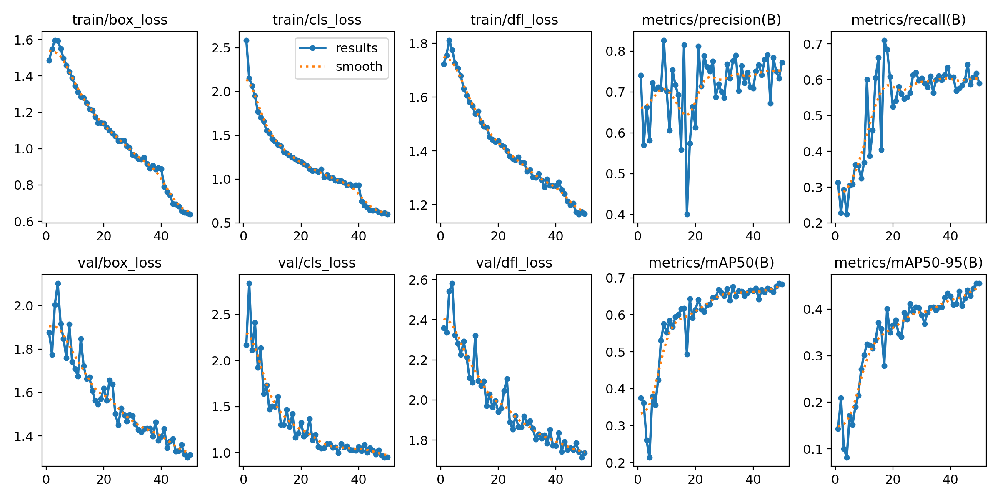

Tuned Training Results


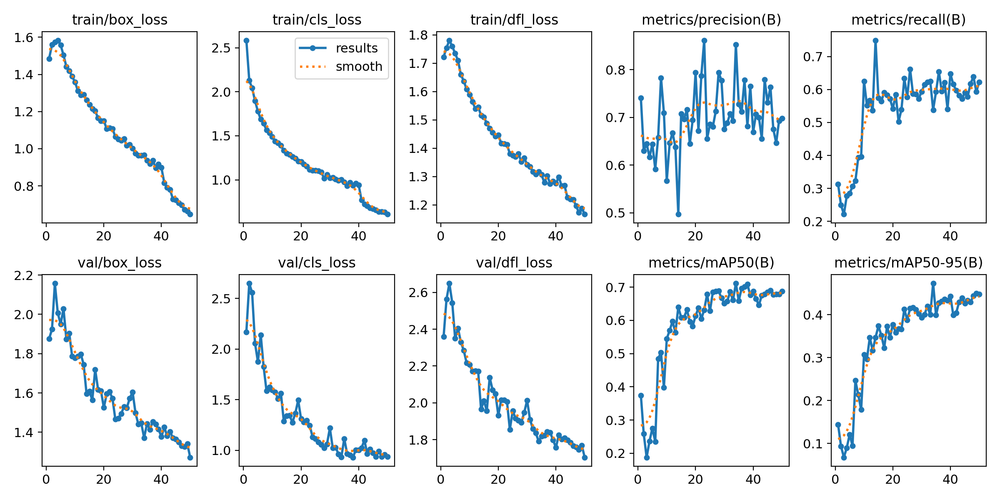

In [32]:
from IPython.display import Image, display

print("Baseline Training Results")
display(Image(filename='runs/detect/fall_yolov8n_baseline5/results.png'))

print("Tuned Training Results")
display(Image(filename='runs/detect/fall_yolov8n_tuned/results.png'))

## **Evaluation Metrics**

In [33]:
metrics = model.val()
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps   # map50-95 of each category
metrics.box.mp    # P
metrics.box.mr    # R

precision = metrics.box.mp         # Precision
recall = metrics.box.mr            # Recall
map50 = metrics.box.map50          # mAP@50
map95 = metrics.box.map            # mAP@50 -95
f1_score = 2 * (precision * recall) / (precision + recall)

print("Model Evaluation Metrics:")
print(f"Precision: {precision:.3f}")
print(f"Recall: {recall:.3f}")
print(f"F1-score: {f1_score:.3f}")
print(f"mAP@50: {map50:.3f}")
print(f"mAP@50-95: {map95:.3f}")

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.6±0.2 ms, read: 22.9±17.3 MB/s, size: 36.9 KB)
val: Scanning /content/drive/.shortcut-targets-by-id/1bRDoglAXKiYpWkFISBu30kGheB2g6-uX/360_Project/Datasets/csv_final_dataset/labels/val.cache... 211 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 211/211 288.5Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 3.0it/s 4.6s
                   all        211        219      0.649      0.648      0.712      0.474
                fallen        150        150      0.806       0.92      0.936      0.613
               sitting         65         67      0.875      0.525      0.705      0.364
              standing          2          2      0.266        0.5      0.496      0.446
Speed: 3.2ms preprocess, 8.0ms inference, 0.0ms

Confusion Matrix

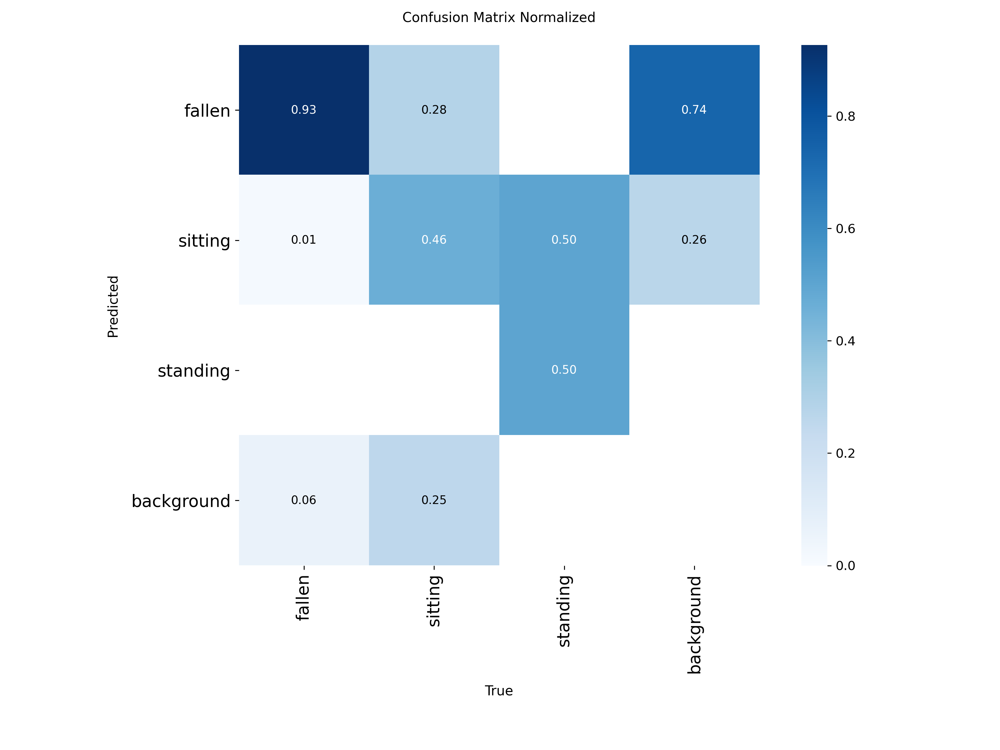

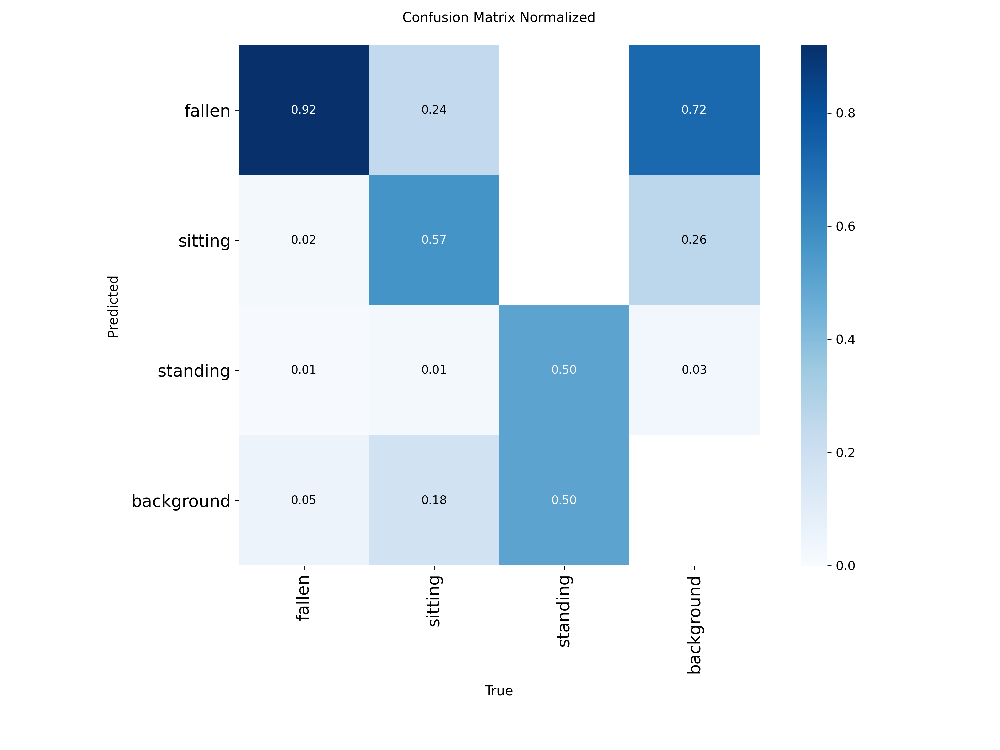

In [34]:
%matplotlib inline
from IPython.display import display
from PIL import Image

baseline = Image.open('/content/runs/detect/fall_yolov8n_baseline5/confusion_matrix_normalized.png')
tuned = Image.open('/content/runs/detect/fall_yolov8n_tuned/confusion_matrix_normalized.png')

display(baseline)
display(tuned)

## **Precision, Recall, Curves**

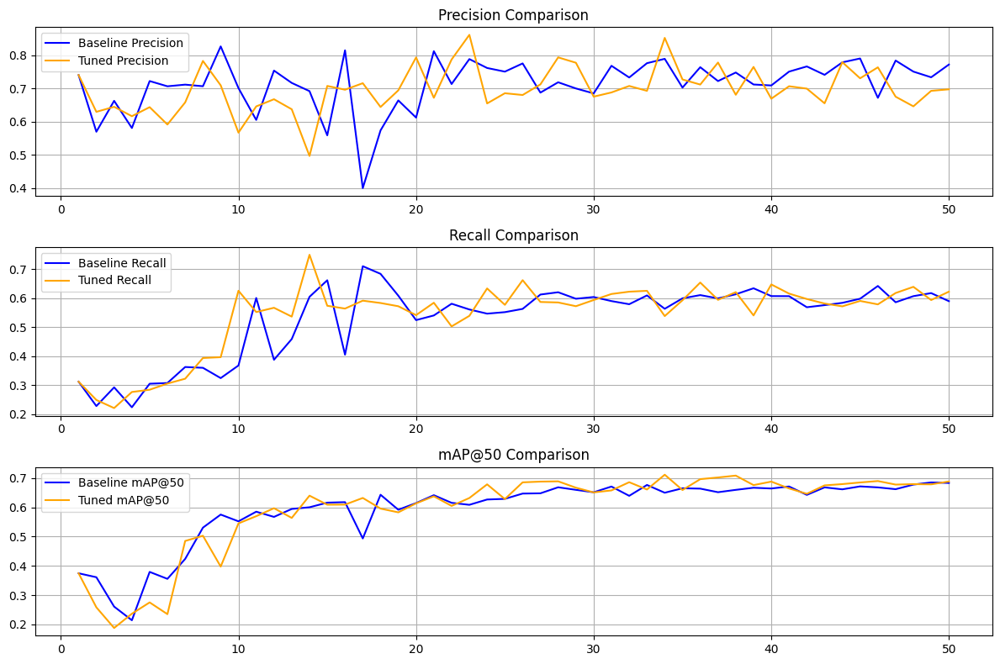

In [35]:
baseline_csv = "runs/detect/fall_yolov8n_baseline5/results.csv"
tuned_csv = "runs/detect/fall_yolov8n_tuned/results.csv"

baseline_df = pd.read_csv(baseline_csv)
tuned_df = pd.read_csv(tuned_csv)

plt.figure(figsize=(12, 8))

# Plot Precision
plt.subplot(3, 1, 1)
plt.plot(baseline_df["epoch"], baseline_df["metrics/precision(B)"], label="Baseline Precision", color="blue")
plt.plot(tuned_df["epoch"], tuned_df["metrics/precision(B)"], label="Tuned Precision", color="orange")
plt.title("Precision Comparison")
plt.legend()
plt.grid(True)

# Plot Recall
plt.subplot(3, 1, 2)
plt.plot(baseline_df["epoch"], baseline_df["metrics/recall(B)"], label="Baseline Recall", color="blue")
plt.plot(tuned_df["epoch"], tuned_df["metrics/recall(B)"], label="Tuned Recall", color="orange")
plt.title("Recall Comparison")
plt.legend()
plt.grid(True)

# Plot mAP50
plt.subplot(3, 1, 3)
plt.plot(baseline_df["epoch"], baseline_df["metrics/mAP50(B)"], label="Baseline mAP@50", color="blue")
plt.plot(tuned_df["epoch"], tuned_df["metrics/mAP50(B)"], label="Tuned mAP@50", color="orange")
plt.title("mAP@50 Comparison")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# **Results & Edge/Fail cases**

Baseline results


image 1/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_01_01_jpeg.rf.4189c8d8563b50ce28844653bd5e79cd.jpg: 384x640 1 fallen, 8.5ms
image 2/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_02_01_jpg.rf.15002eb37ac71dbe6956e583e63ddc8a.jpg: 640x576 1 fallen, 7.8ms
image 3/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_03_01_jpeg.rf.821d35139d44746d8949b5eb0f40d08a.jpg: 320x640 1 fallen, 1 sitting, 6.4ms
image 4/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_04_01_png.rf.0b85f918f20e21513eaa73db460fb3f8.jpg: 448x640 1 fallen, 6.4ms
image 5/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_05_01_jpeg.rf.6b8ad3072efc5ba4c714d773a989b603.jpg: 608x640 1 fallen, 8.8ms
image 6/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_06_01_jpeg.rf.f4001377ae99a81c00598f86219a7388.jpg: 640x384 (no detections),

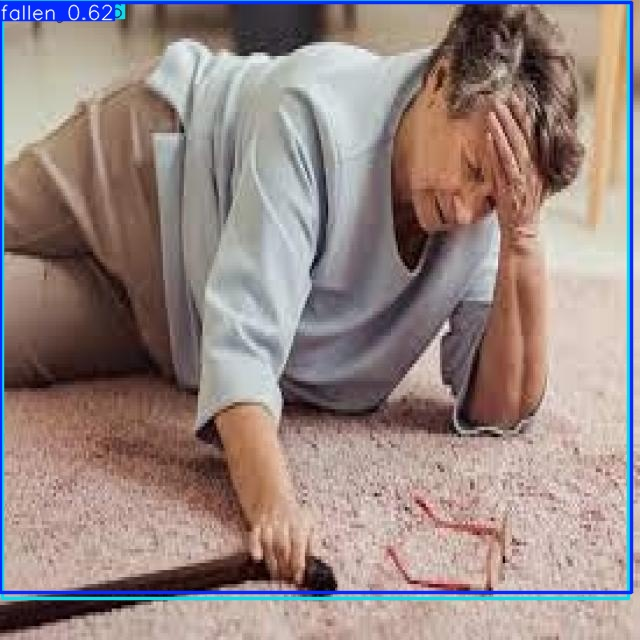

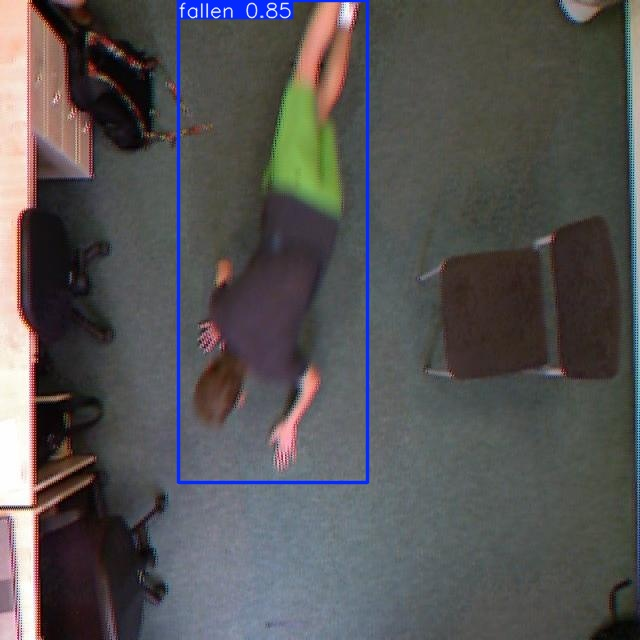

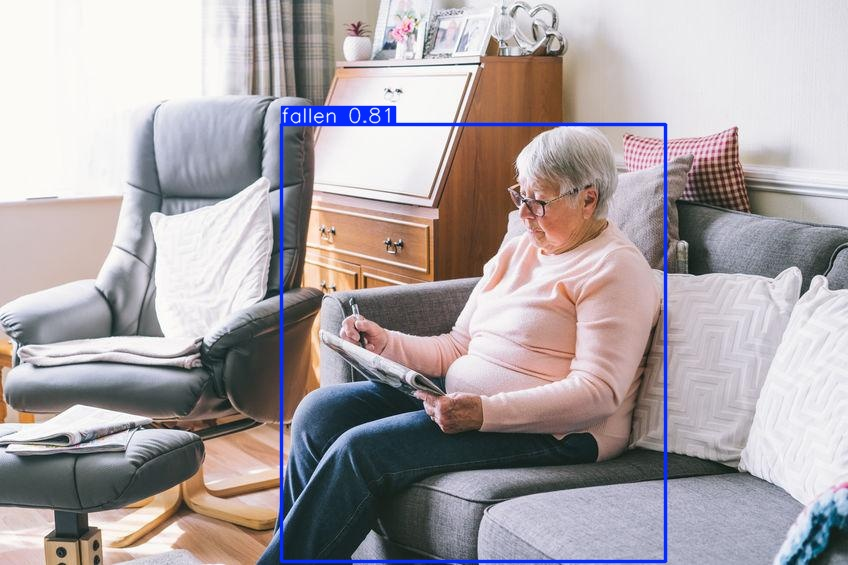

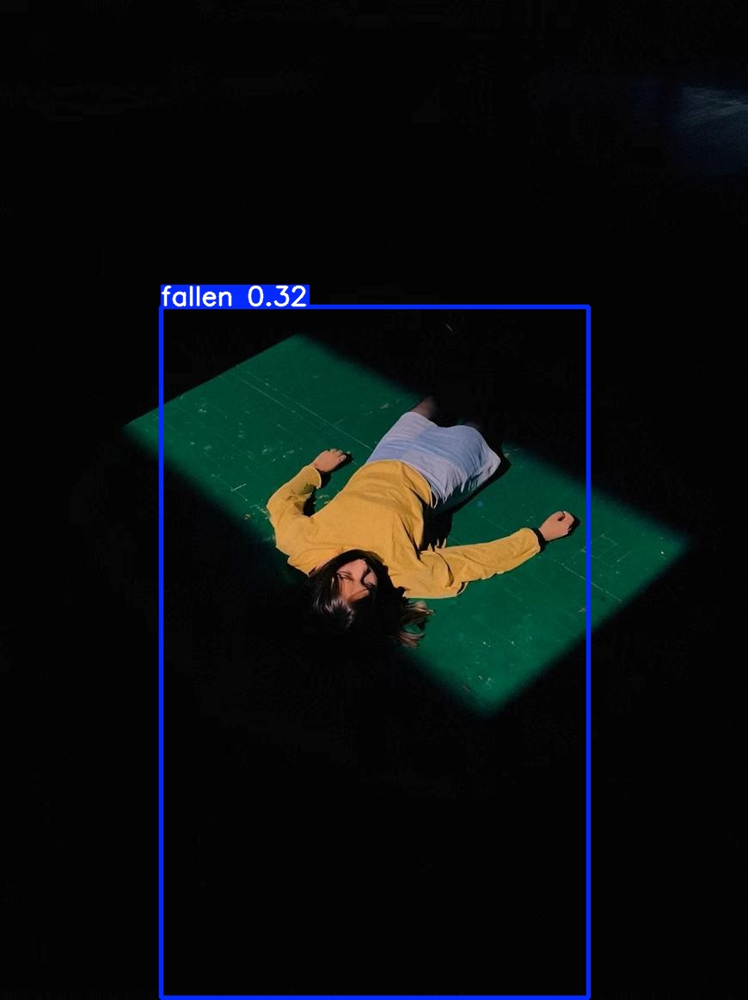

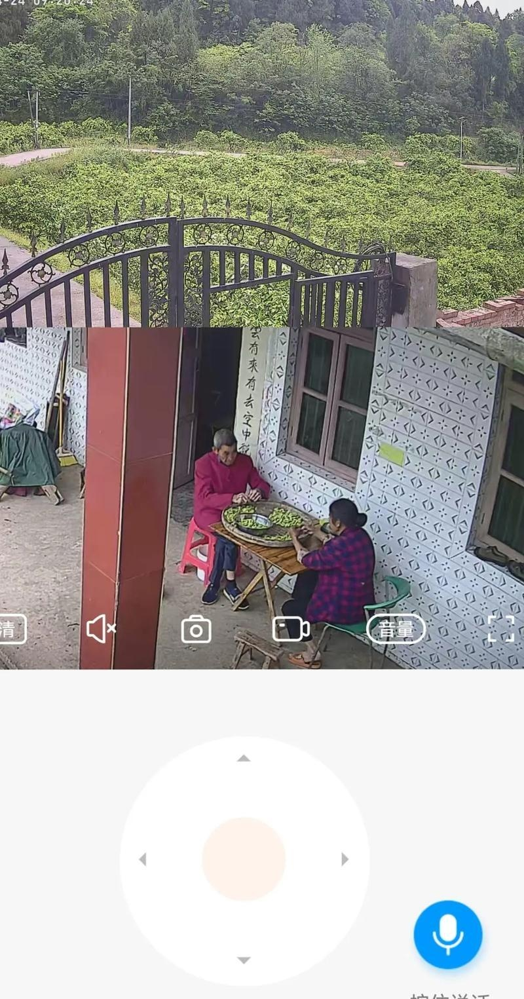

...

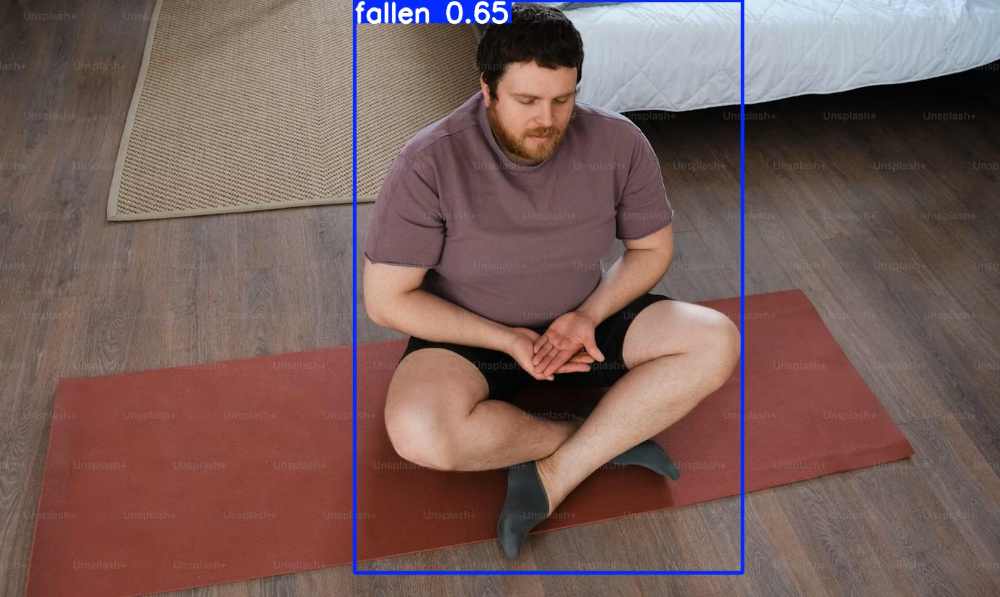

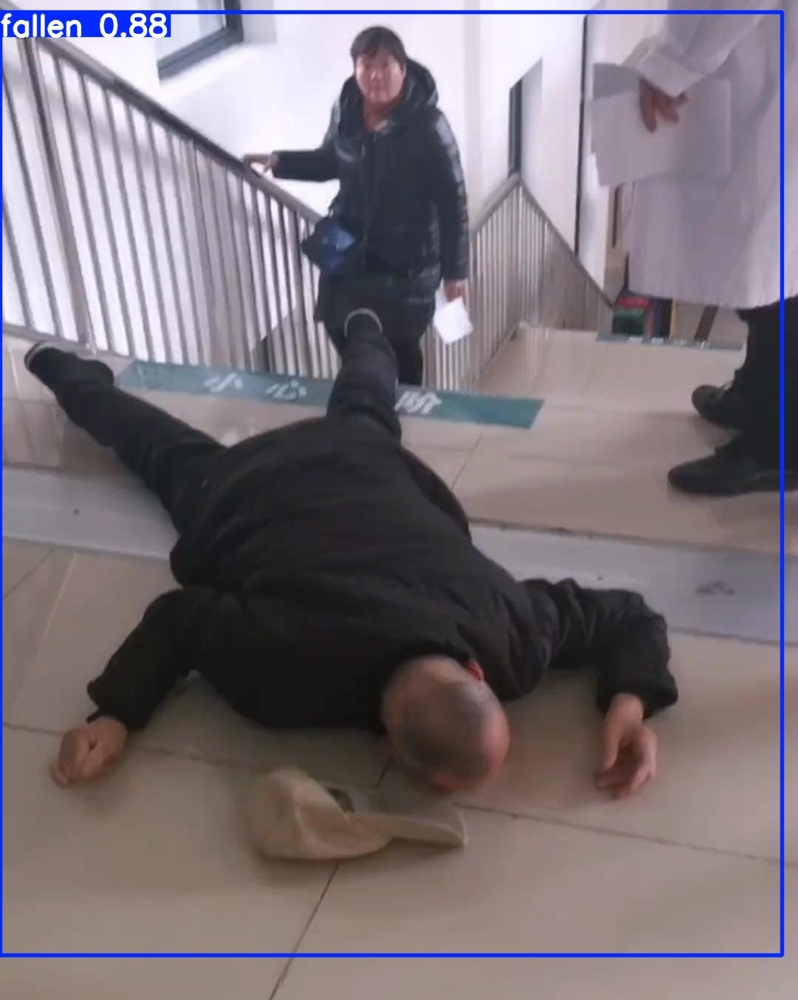

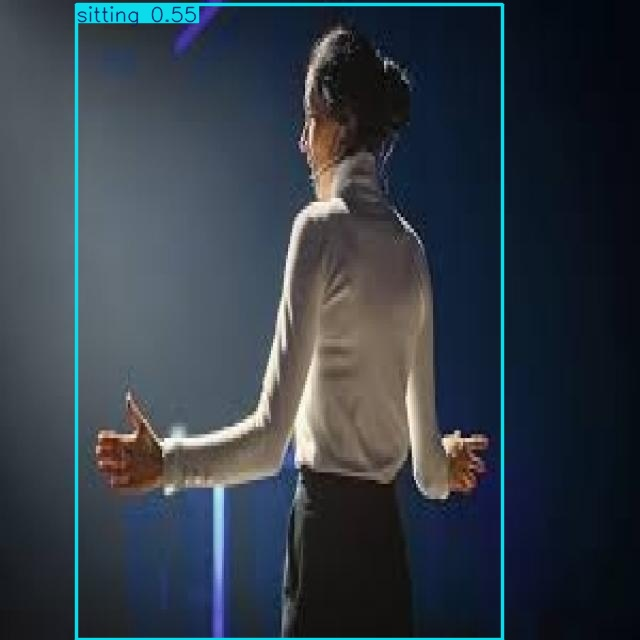

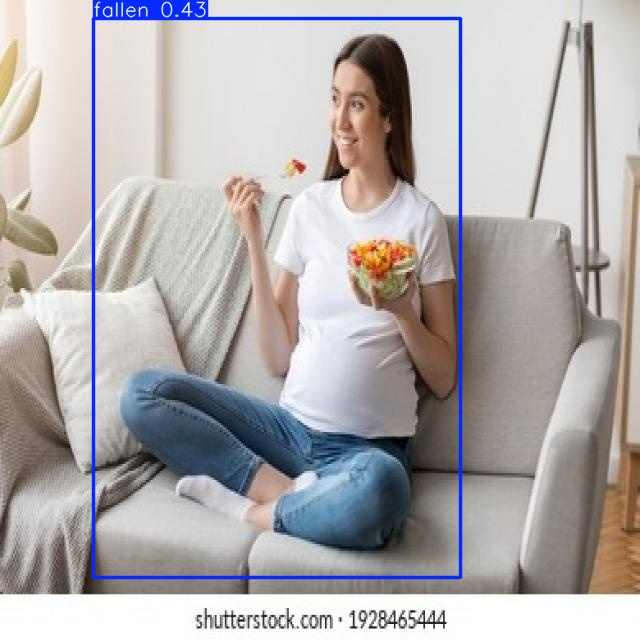

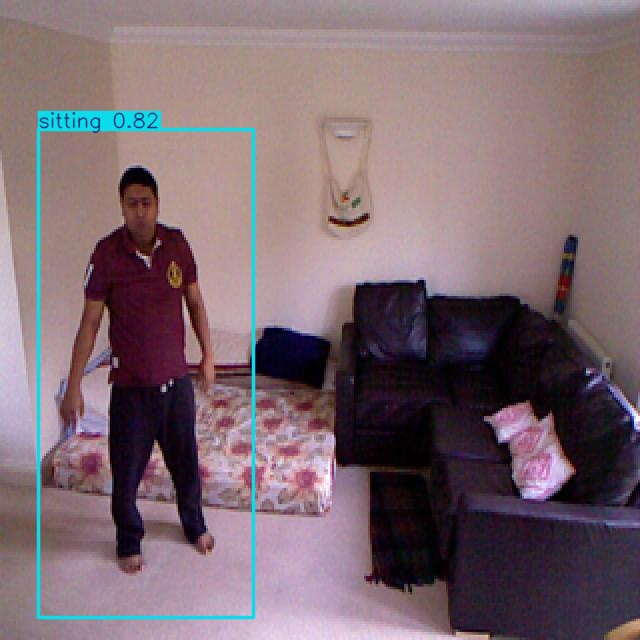

In [38]:
from IPython.display import Image, display

model_path = "runs/detect/fall_yolov8n_baseline5/weights/best.pt"
model = YOLO(model_path)


!mkdir -p runs/detect/fail_cases
model.predict(
    source=f"/content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test",
    conf=0.25,
    iou=0.5,
    save=True,
    name="fail_cases"
)


result_dir = "runs/detect/fail_cases2"
for i, f in enumerate(os.listdir(result_dir)):
    if f.endswith(".jpg") and i < 30:
        display(Image(filename=os.path.join(result_dir, f)))

Tuned results


image 1/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_01_01_jpeg.rf.4189c8d8563b50ce28844653bd5e79cd.jpg: 384x640 1 fallen, 6.5ms
image 2/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_02_01_jpg.rf.15002eb37ac71dbe6956e583e63ddc8a.jpg: 640x576 1 fallen, 7.8ms
image 3/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_03_01_jpeg.rf.821d35139d44746d8949b5eb0f40d08a.jpg: 320x640 1 fallen, 2 sittings, 8.5ms
image 4/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_04_01_png.rf.0b85f918f20e21513eaa73db460fb3f8.jpg: 448x640 2 fallens, 6.8ms
image 5/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_05_01_jpeg.rf.6b8ad3072efc5ba4c714d773a989b603.jpg: 608x640 2 fallens, 7.8ms
image 6/111 /content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test/01_06_01_jpeg.rf.f4001377ae99a81c00598f86219a7388.jpg: 640x384 (no detection

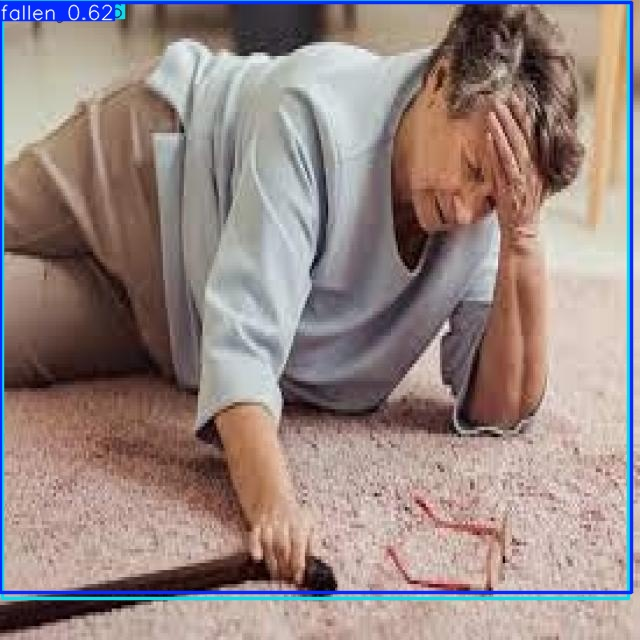

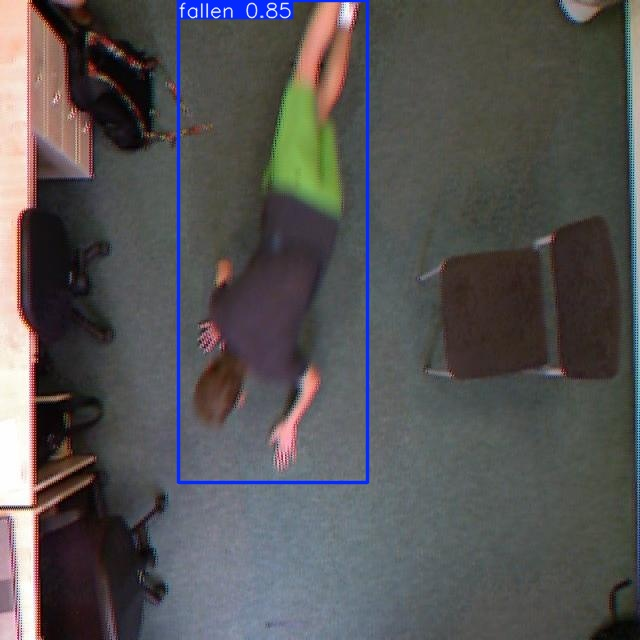

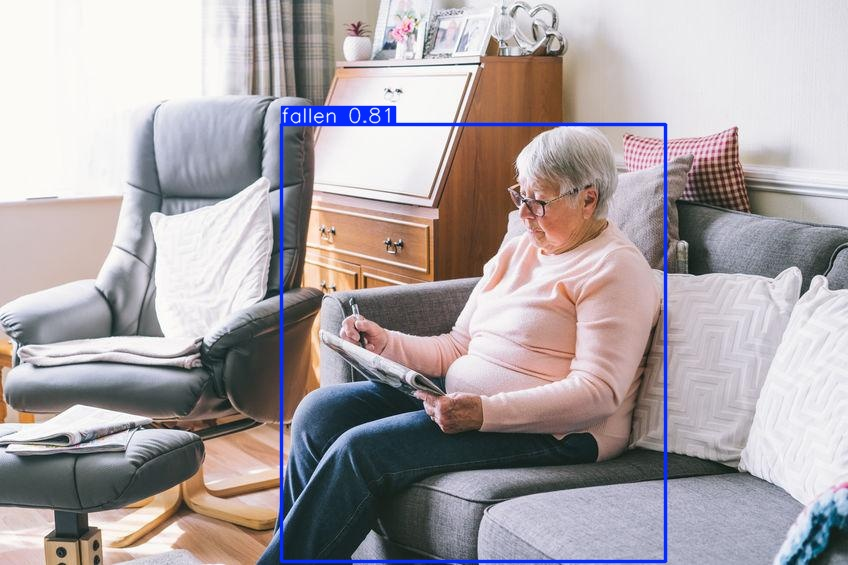

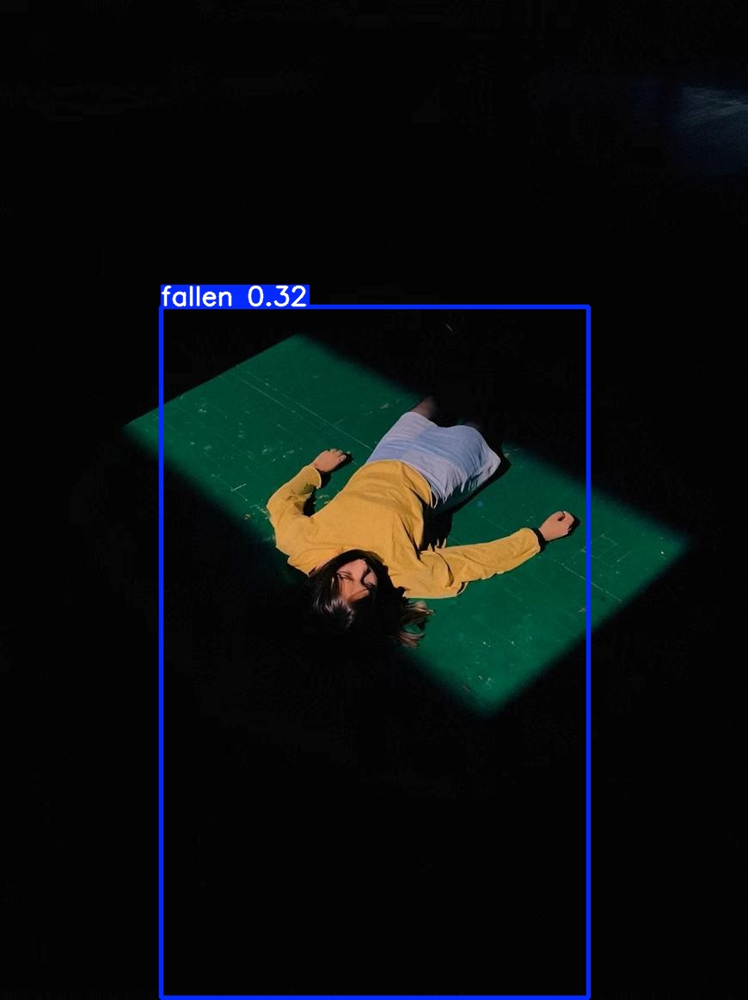

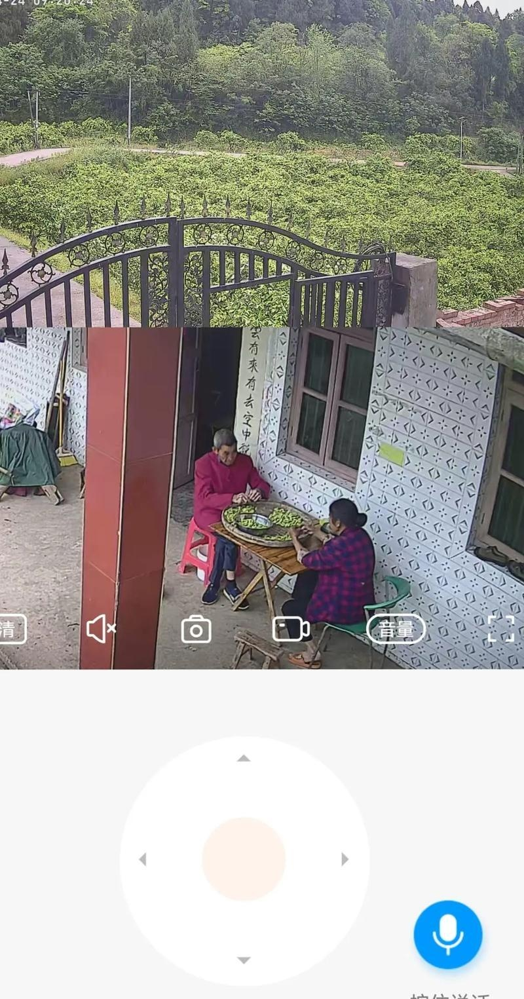

...

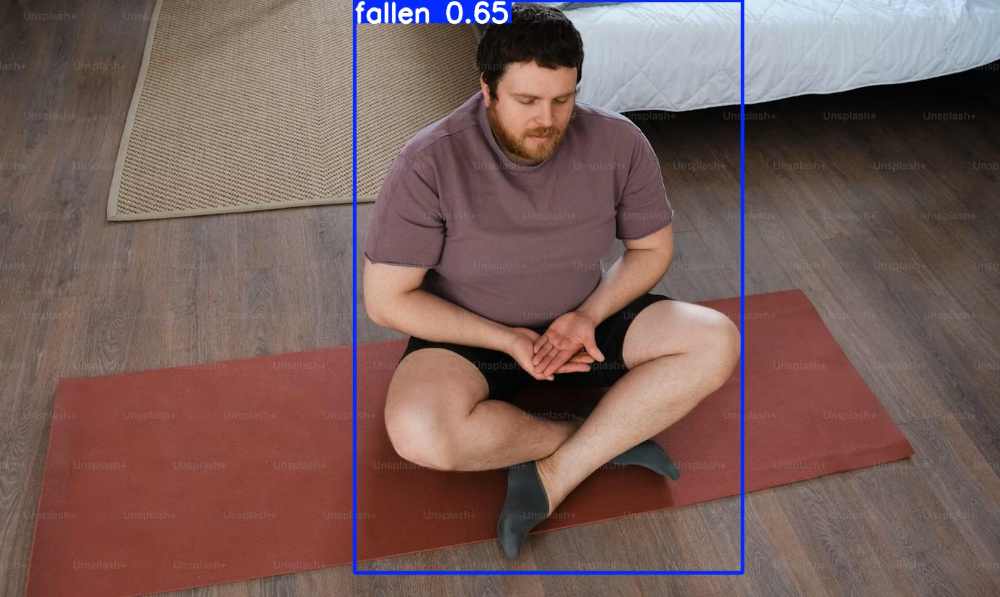

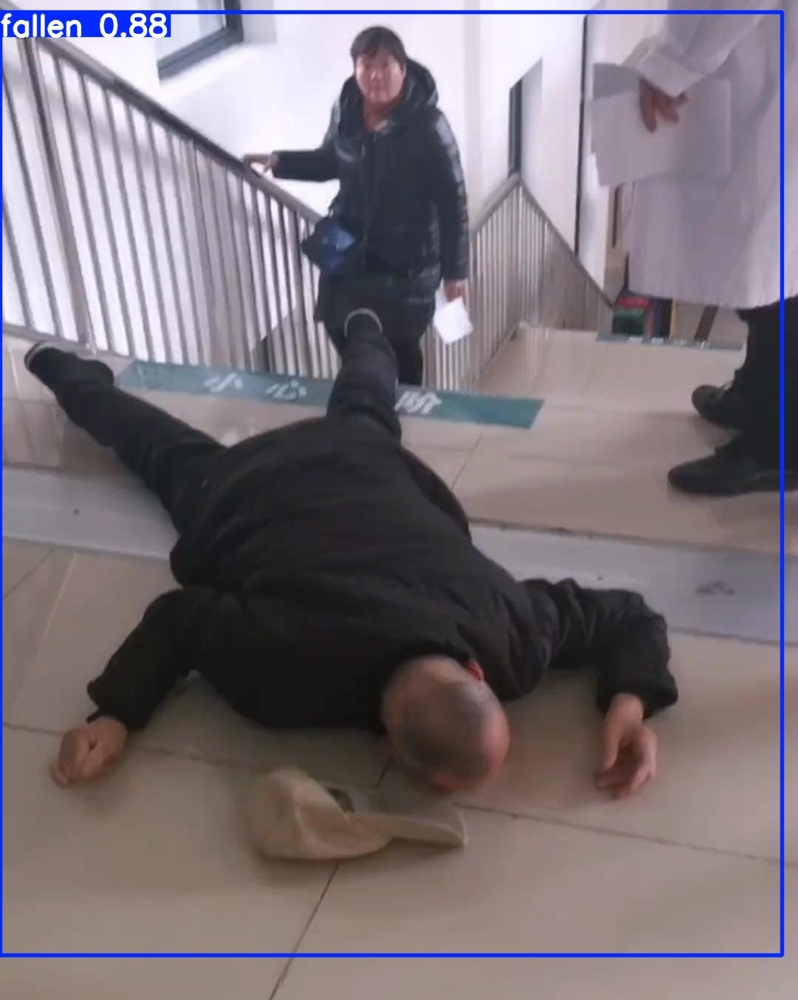

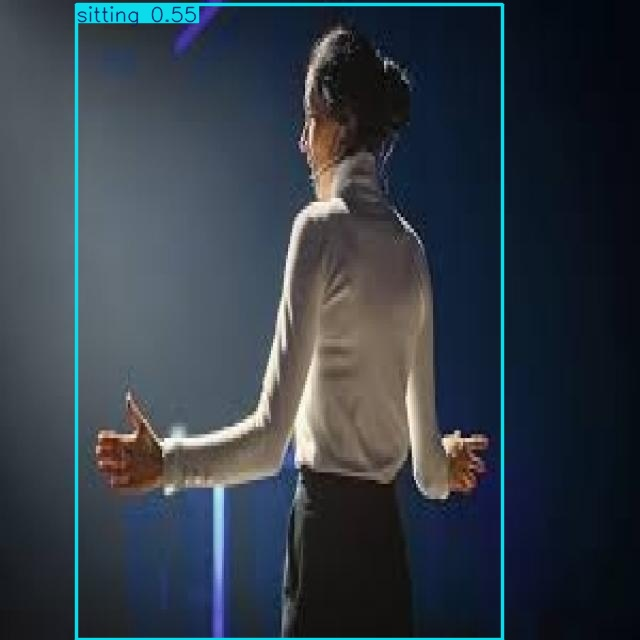

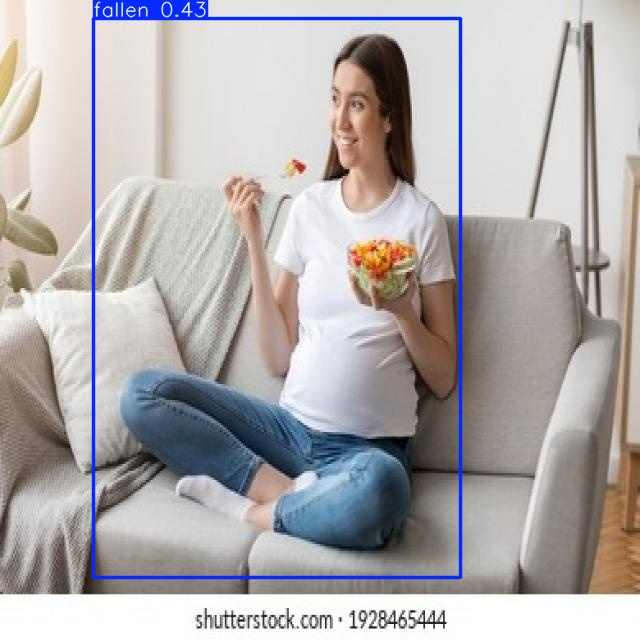

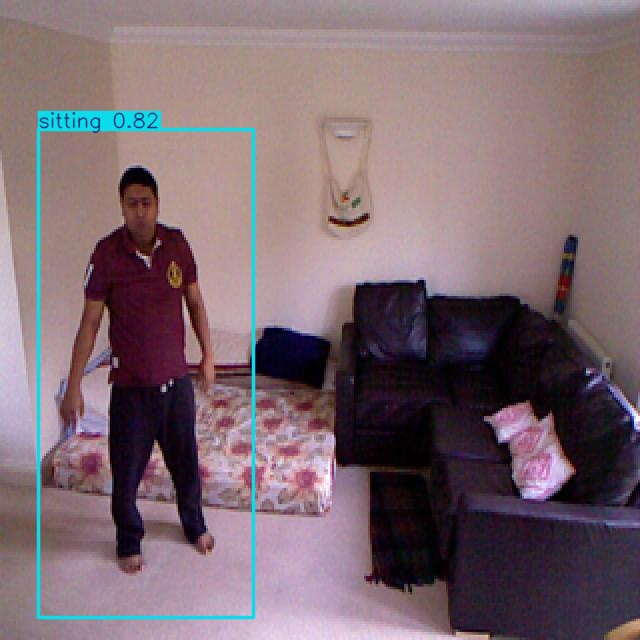

In [40]:
from IPython.display import Image, display

model_path = "runs/detect/fall_yolov8n_tuned/weights/best.pt"
model = YOLO(model_path)


!mkdir -p runs/detect/fail_cases
model.predict(
    source=f"/content/drive/MyDrive/360_Project/Datasets/csv_final_dataset/images/test",
    conf=0.25,
    iou=0.5,
    save=True,
    name="fail_cases"
)


result_dir = "runs/detect/fail_cases2"
for i, f in enumerate(os.listdir(result_dir)):
    if f.endswith(".jpg") and i < 30:
        display(Image(filename=os.path.join(result_dir, f)))